### Assignment-6

### Advanced GAN's

##### Poojitha Venkatram

### Importing Necessary Libraries

In [ ]:
!pip install torch_snippets torch_summary --quiet
import itertools
from PIL import Image
from torch_snippets import *
from torchvision import transforms
from torchvision.utils import make_grid
from torchsummary import summary

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.6/79.6 kB 2.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 8.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.5/62.5 kB 5.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.6/78.6 kB 7.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 204.2/204.2 kB 10.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.4/4.4 MB 28.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 43.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.9/98.9 kB 6.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.8/3.8 MB 66.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 30.6/30.6 MB 44.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 177.4/177.4 kB 2.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.4/3.4 MB 48.0 MB/s eta 0:0

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!unzip "/content/drive/MyDrive/HW_06 Dataset.zip" -d "/content/dataset"

Streaming output truncated to the last 5000 lines.
  inflating: /content/dataset/HW_06 Dataset/trainB/2015-01-08 18_50_17.jpg  
  inflating: /content/dataset/__MACOSX/HW_06 Dataset/trainB/._2015-01-08 18_50_17.jpg  
  inflating: /content/dataset/HW_06 Dataset/trainB/2014-05-04 19_47_43.jpg  
  inflating: /content/dataset/__MACOSX/HW_06 Dataset/trainB/._2014-05-04 19_47_43.jpg  
  inflating: /content/dataset/HW_06 Dataset/trainB/2015-02-22 15_25_59.jpg  
  inflating: /content/dataset/__MACOSX/HW_06 Dataset/trainB/._2015-02-22 15_25_59.jpg  
  inflating: /content/dataset/HW_06 Dataset/trainB/2016-05-19 18_49_52.jpg  
  inflating: /content/dataset/__MACOSX/HW_06 Dataset/trainB/._2016-05-19 18_49_52.jpg  
  inflating: /content/dataset/HW_06 Dataset/trainB/2014-11-13 03_46_31.jpg  
  inflating: /content/dataset/__MACOSX/HW_06 Dataset/trainB/._2014-11-13 03_46_31.jpg  
  inflating: /content/dataset/HW_06 Dataset/trainB/2015-05-20 01_25_46.jpg  
  inflating: /content/dataset/__MACOSX/HW_06 Da

In [ ]:
from torchvision import transforms

transform = transforms.Compose([
    transforms.Resize((256, 256)),  # Resize the images to 256x256
    transforms.ToTensor(),  # Convert the images to PyTorch tensors
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),  # Normalize the tensors
])

In [ ]:
!ls "/content/dataset/HW_06 Dataset"

metadata.csv  testA  testB  trainA  trainB


In [ ]:
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import os

class CustomDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        """
        Args:
            root_dir (string): Directory with all the images.
            transform (callable, optional): Optional transform to be applied
                on a sample.
        """
        self.root_dir = root_dir
        self.transform = transform
        self.image_files = [f for f in os.listdir(root_dir) if os.path.isfile(os.path.join(root_dir, f))]

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        img_name = os.path.join(self.root_dir, self.image_files[idx])
        image = Image.open(img_name).convert('RGB')  # Ensure image is RGB
        if self.transform:
            image = self.transform(image)

        return image

In [ ]:
from torchvision import datasets, transforms
from torch.utils.data import DataLoader

# Define your transformations
transform = transforms.Compose([
    transforms.Resize(256),  # Resize images to 256x256
    transforms.CenterCrop(256),
    transforms.ToTensor(),  # Convert images to Tensor
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])  # Normalize images
])

In [ ]:
trainA_dataset = CustomDataset(root_dir='/content/dataset/HW_06 Dataset/trainA', transform=transform)
trainA_loader = DataLoader(trainA_dataset, batch_size=1, shuffle=True)

trainB_dataset = CustomDataset(root_dir='/content/dataset/HW_06 Dataset/trainB', transform=transform)
trainB_loader = DataLoader(trainB_dataset, batch_size=1, shuffle=True)

testA_dataset = CustomDataset(root_dir='/content/dataset/HW_06 Dataset/testA', transform=transform)
testA_loader = DataLoader(testA_dataset, batch_size=1, shuffle=False)  # Usually, you don't need to shuffle the test set

testB_dataset = CustomDataset(root_dir='/content/dataset/HW_06 Dataset/testB', transform=transform)
testB_loader = DataLoader(testB_dataset, batch_size=1, shuffle=False)

Shape of the batch:
torch.Size([1, 3, 256, 256])

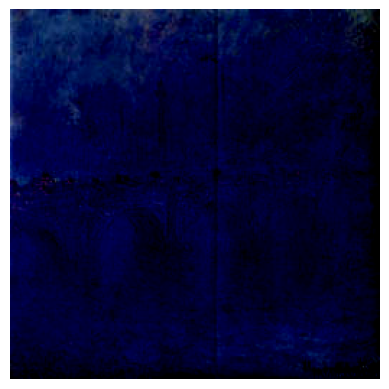

Shape of the batch:
torch.Size([1, 3, 256, 256])

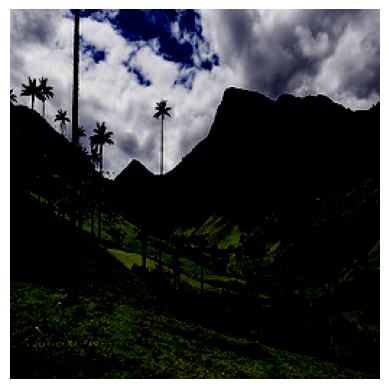

Shape of the batch:
torch.Size([1, 3, 256, 256])

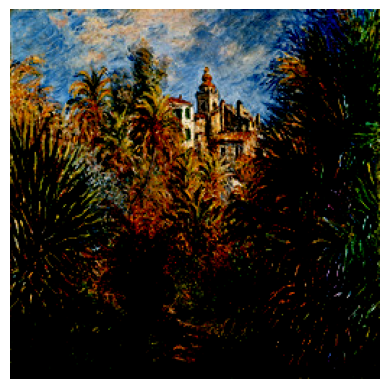

Shape of the batch:
torch.Size([1, 3, 256, 256])

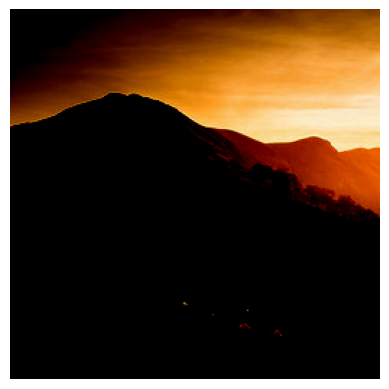

In [ ]:
import matplotlib.pyplot as plt

# Function to display an image
def imshow(img):
    plt.imshow(img.permute(1, 2, 0))  # rearrange the dimensions to [height, width, channels]
    plt.axis('off')  # turn off the axis numbers/labels
    plt.show()

# Check the shape of the images and display the first image from each dataset
for data_loader in [trainA_loader, trainB_loader, testA_loader, testB_loader]:
    for images in data_loader:
        print("Shape of the batch:", images.shape)  # Shape of the batch
        imshow(images[0])  # Show the first image of the batch
        break  # Only process the first batch

#### Train and Test Dataset

In [ ]:
import torch
from torch.utils.data import Dataset, DataLoader
import glob
import random
from PIL import Image
from torchvision.transforms import Compose, Resize, ToTensor, Normalize

class Monet2PhotoDataset(Dataset):
    def __init__(self, monet_dir, photo_dir, transform=None):
        # Get the list of image paths
        self.monet_images = glob.glob(monet_dir + '/*.jpg')
        self.photo_images = glob.glob(photo_dir + '/*.jpg')
        self.transform = transform

    def __getitem__(self, ix):
        monet_image_path = self.monet_images[ix % len(self.monet_images)]
        # Choose a random photo image to pair with the chosen Monet image
        photo_image_path = random.choice(self.photo_images)
        monet_image = Image.open(monet_image_path).convert('RGB')
        photo_image = Image.open(photo_image_path).convert('RGB')

        if self.transform:
            monet_image = self.transform(monet_image)
            photo_image = self.transform(photo_image)

        return monet_image, photo_image

    def __len__(self):
        return max(len(self.monet_images), len(self.photo_images))

# Define the transform
transform = Compose([
    Resize((256, 256)),
    ToTensor(),
    Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5]),
])

# Instantiating the dataset with directories and transform
monet2photo_dataset = Monet2PhotoDataset(
    monet_dir='/content/dataset/HW_06 Dataset/trainA',
    photo_dir='/content/dataset/HW_06 Dataset/trainB',
    transform=transform
)

# Creating DataLoader
data_loader = DataLoader(monet2photo_dataset, batch_size=1, shuffle=True)

### Initializing the Data Loader

In [ ]:
# Initializing datasets
trn_ds = Monet2PhotoDataset(monet_dir='/content/dataset/HW_06 Dataset/trainA', photo_dir='/content/dataset/HW_06 Dataset/trainB', transform=transform)
val_ds = Monet2PhotoDataset(monet_dir='/content/dataset/HW_06 Dataset/testA', photo_dir='/content/dataset/HW_06 Dataset/testB', transform=transform)

# Initializing dataloaders
trn_dl = DataLoader(trn_ds, batch_size=1, shuffle=True)
val_dl = DataLoader(val_ds, batch_size=5, shuffle=True) # Adjusted batch_size to 5 for validation

## Defining Cycle GAN

In [ ]:
def weights_init_normal(m):
    classname = m.__class__.__name__
    if classname.find("Conv") != -1:
        torch.nn.init.normal_(m.weight.data, 0.0, 0.02)
        if hasattr(m, "bias") and m.bias is not None:
            torch.nn.init.constant_(m.bias.data, 0.0)
    elif classname.find("BatchNorm2d") != -1:
        torch.nn.init.normal_(m.weight.data, 1.0, 0.02)
        torch.nn.init.constant_(m.bias.data, 0.0)

## Defining a Residual Block

In [ ]:
class ResidualBlock(nn.Module):
    def __init__(self, in_features):
        super(ResidualBlock, self).__init__()

        self.block = nn.Sequential(
            nn.ReflectionPad2d(1),
            nn.Conv2d(in_features, in_features, 3),
            nn.InstanceNorm2d(in_features),
            nn.ReLU(inplace=True),
            nn.ReflectionPad2d(1),
            nn.Conv2d(in_features, in_features, 3),
            nn.InstanceNorm2d(in_features),
        )

    def forward(self, x):
        return x + self.block(x)

### Generator Class

In [ ]:
class GeneratorResNet(nn.Module):
    def __init__(self, num_residual_blocks=9):
        super(GeneratorResNet, self).__init__()
        out_features = 64
        channels = 3
        model = [
            nn.ReflectionPad2d(3),
            nn.Conv2d(channels, out_features, 7),
            nn.InstanceNorm2d(out_features),
            nn.ReLU(inplace=True),
        ]
        in_features = out_features
        # Downsampling
        for _ in range(2):
            out_features *= 2
            model += [
                nn.Conv2d(in_features, out_features, 3, stride=2, padding=1),
                nn.InstanceNorm2d(out_features),
                nn.ReLU(inplace=True),
            ]
            in_features = out_features

        # Residual blocks
        for _ in range(num_residual_blocks):
            model += [ResidualBlock(out_features)]

        # Upsampling
        for _ in range(2):
            out_features //= 2
            model += [
                nn.Upsample(scale_factor=2),
                nn.Conv2d(in_features, out_features, 3, stride=1, padding=1),
                nn.InstanceNorm2d(out_features),
                nn.ReLU(inplace=True),
            ]
            in_features = out_features

        # Output layer
        model += [nn.ReflectionPad2d(channels), nn.Conv2d(out_features, channels, 7), nn.Tanh()]
        self.model = nn.Sequential(*model)
        self.apply(weights_init_normal)
    def forward(self, x):
        return self.model(x)

### Discriminator Class

In [ ]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()

        channels, height, width = 3, IMAGE_SIZE, IMAGE_SIZE

        def discriminator_block(in_filters, out_filters, normalize=True):
            """Returns downsampling layers of each discriminator block"""
            layers = [nn.Conv2d(in_filters, out_filters, 4, stride=2, padding=1)]
            if normalize:
                layers.append(nn.InstanceNorm2d(out_filters))
            layers.append(nn.LeakyReLU(0.2, inplace=True))
            return layers

        self.model = nn.Sequential(
            *discriminator_block(channels, 64, normalize=False),
            *discriminator_block(64, 128),
            *discriminator_block(128, 256),
            *discriminator_block(256, 512),
            nn.ZeroPad2d((1, 0, 1, 0)),
            nn.Conv2d(512, 1, 4, padding=1)
        )
        self.apply(weights_init_normal)

    def forward(self, img):
        return self.model(img)

### Generating samples from Cycle GAN

In [ ]:
import matplotlib.pyplot as plt
import torch
from torchvision.utils import make_grid
from torch import no_grad

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

@no_grad()
def generate_sample():
    data = next(iter(val_dl))
    real_A, real_B = data
    # Move data to the same device as the model
    real_A = real_A.to(device)
    real_B = real_B.to(device)

    # Set models to evaluation mode
    G_AB.eval()
    G_BA.eval()

    # Generate fake images
    fake_B = G_AB(real_A)
    fake_A = G_BA(real_B)

    # Arrange images along the x-axis
    real_A = make_grid(real_A, nrow=5, normalize=True)
    real_B = make_grid(real_B, nrow=5, normalize=True)
    fake_A = make_grid(fake_A, nrow=5, normalize=True)
    fake_B = make_grid(fake_B, nrow=5, normalize=True)

    # Arrange images along the y-axis
    image_grid = torch.cat((real_A, fake_B, real_B, fake_A), 1)

    # Convert to numpy and display
    show(image_grid.detach().cpu().permute(1, 2, 0).numpy(), sz=12)

def show(image, sz=10):
    plt.figure(figsize=(sz, sz))
    plt.imshow(image)
    plt.axis('off')
    plt.show()

### Defining the Generator Training Step

In [ ]:
def generator_train_step(Gs, optimizer, real_A, real_B):
    G_AB, G_BA = Gs
    optimizer.zero_grad()
    loss_id_A = criterion_identity(G_BA(real_A), real_A)
    loss_id_B = criterion_identity(G_AB(real_B), real_B)

    loss_identity = (loss_id_A + loss_id_B) / 2
    fake_B = G_AB(real_A)
    loss_GAN_AB = criterion_GAN(D_B(fake_B), torch.Tensor(np.ones((len(real_A), 1, 16, 16))).to(device))
    fake_A = G_BA(real_B)
    loss_GAN_BA = criterion_GAN(D_A(fake_A), torch.Tensor(np.ones((len(real_A), 1, 16, 16))).to(device))

    loss_GAN = (loss_GAN_AB + loss_GAN_BA) / 2
    recov_A = G_BA(fake_B)
    loss_cycle_A = criterion_cycle(recov_A, real_A)
    recov_B = G_AB(fake_A)
    loss_cycle_B = criterion_cycle(recov_B, real_B)

    loss_cycle = (loss_cycle_A + loss_cycle_B) / 2
    loss_G = loss_GAN + lambda_cyc * loss_cycle + lambda_id * loss_identity
    loss_G.backward()
    optimizer.step()
    return loss_G, loss_identity, loss_GAN, loss_cycle, loss_G, fake_A, fake_B

In [ ]:
IMAGE_SIZE = 256

### Defining the Discriminator Training Step

In [ ]:
def discriminator_train_step(D, real_data, fake_data, optimizer):
    optimizer.zero_grad()
    loss_real = criterion_GAN(D(real_data), torch.Tensor(np.ones((len(real_data), 1, 16, 16))).to(device))
    loss_fake = criterion_GAN(D(fake_data.detach()), torch.Tensor(np.zeros((len(real_data), 1, 16, 16))).to(device))
    loss_D = (loss_real + loss_fake) / 2
    loss_D.backward()
    optimizer.step()
    return loss_D

In [ ]:
G_AB = GeneratorResNet().to(device)
G_BA = GeneratorResNet().to(device)
D_A = Discriminator().to(device)
D_B = Discriminator().to(device)

criterion_GAN = torch.nn.MSELoss()
criterion_cycle = torch.nn.L1Loss()
criterion_identity = torch.nn.L1Loss()

optimizer_G = torch.optim.Adam(
    itertools.chain(G_AB.parameters(), G_BA.parameters()), lr=0.0002, betas=(0.5, 0.999)
)
optimizer_D_A = torch.optim.Adam(D_A.parameters(), lr=0.0002, betas=(0.5, 0.999))
optimizer_D_B = torch.optim.Adam(D_B.parameters(), lr=0.0002, betas=(0.5, 0.999))

lambda_cyc, lambda_id = 10.0, 5.0

## Training the Cycle GAN

EPOCH: 1.000  loss_D: 0.214  loss_G: 3.991  loss_GAN: 0.238  loss_cycle: 0.261  loss_identity: 0.229  (1379.55s - 5518.20s remaining)

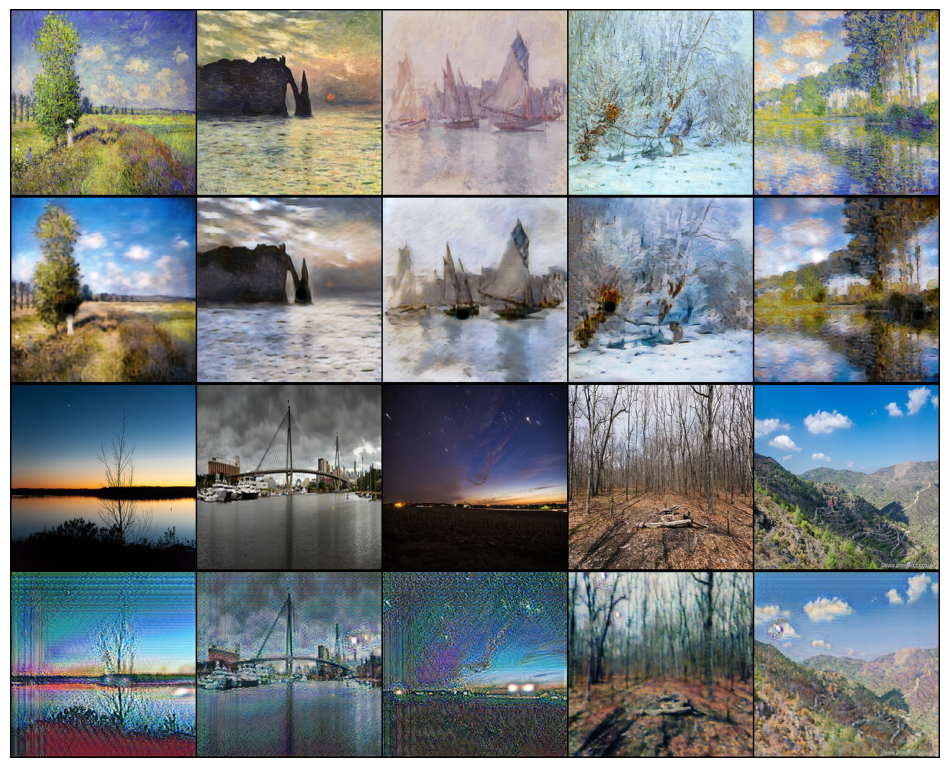

EPOCH: 1.000  loss_GAN: 0.671  loss_D: 0.140  loss_cycle: 0.198  loss_G: 3.578  loss_identity: 0.185  (1380.47s - 5521.87s remaining)
EPOCH: 2.000  loss_D: 0.095  loss_G: 2.865  loss_GAN: 0.884  loss_cycle: 0.144  loss_identity: 0.109  (2763.93s - 4145.89s remaining)

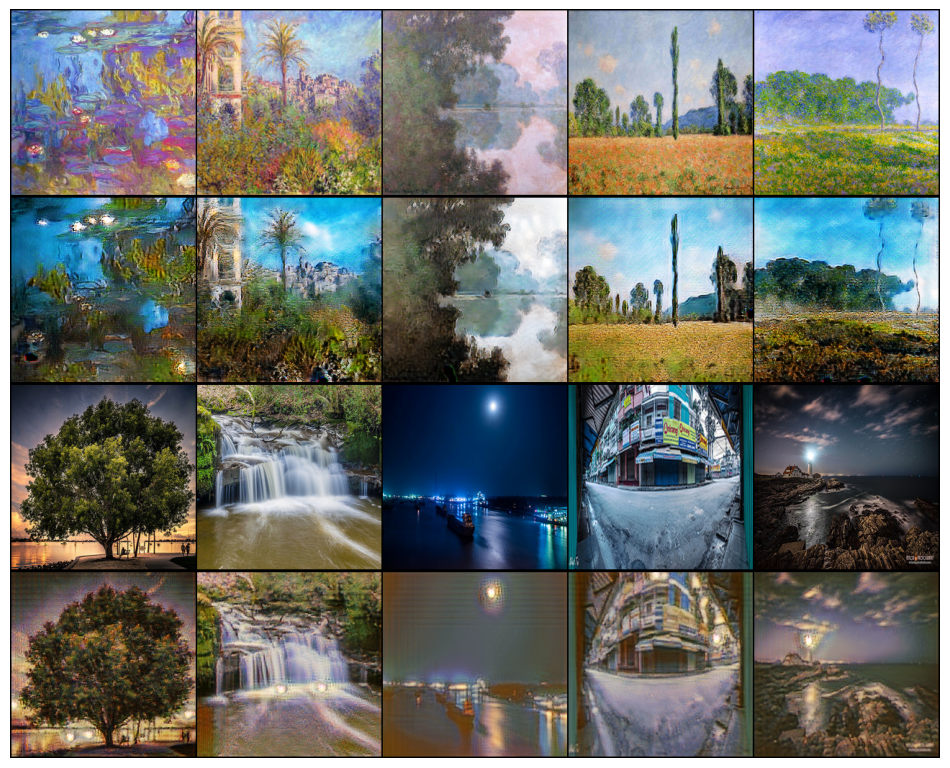

EPOCH: 2.000  loss_GAN: 0.709  loss_D: 0.122  loss_cycle: 0.186  loss_G: 3.437  loss_identity: 0.173  (2764.76s - 4147.14s remaining)
EPOCH: 3.000  loss_D: 0.043  loss_G: 3.178  loss_GAN: 1.017  loss_cycle: 0.147  loss_identity: 0.137  (4142.00s - 2761.33s remaining)

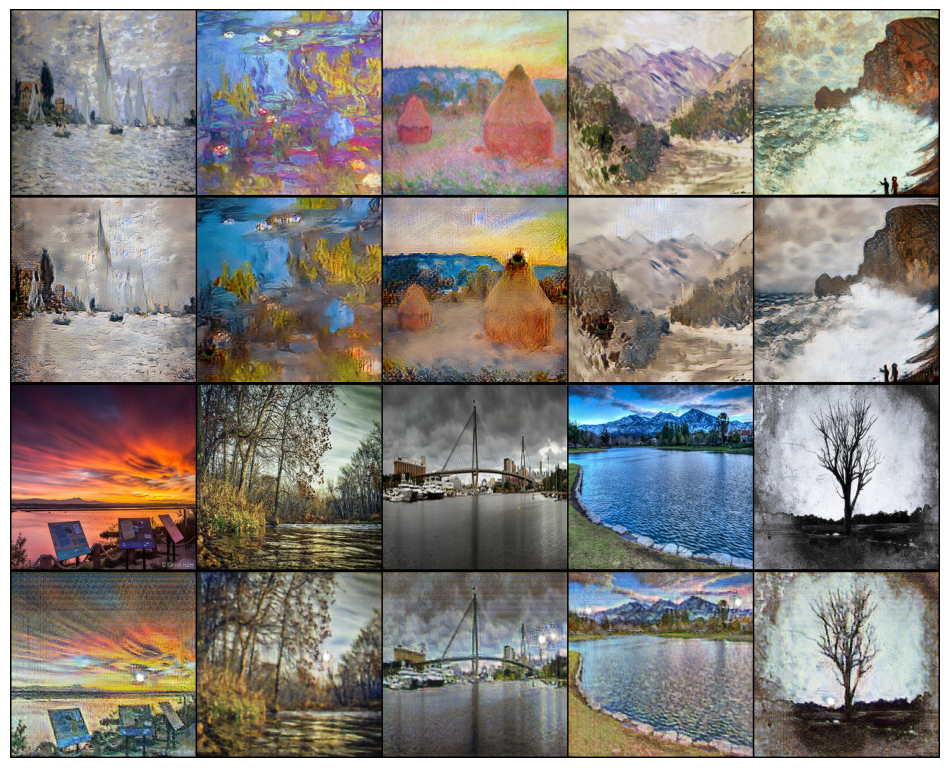

EPOCH: 3.000  loss_GAN: 0.750  loss_D: 0.105  loss_cycle: 0.182  loss_G: 3.414  loss_identity: 0.168  (4142.85s - 2761.90s remaining)
EPOCH: 4.000  loss_D: 0.148  loss_G: 2.378  loss_GAN: 0.930  loss_cycle: 0.096  loss_identity: 0.098  (5514.77s - 1378.69s remaining)

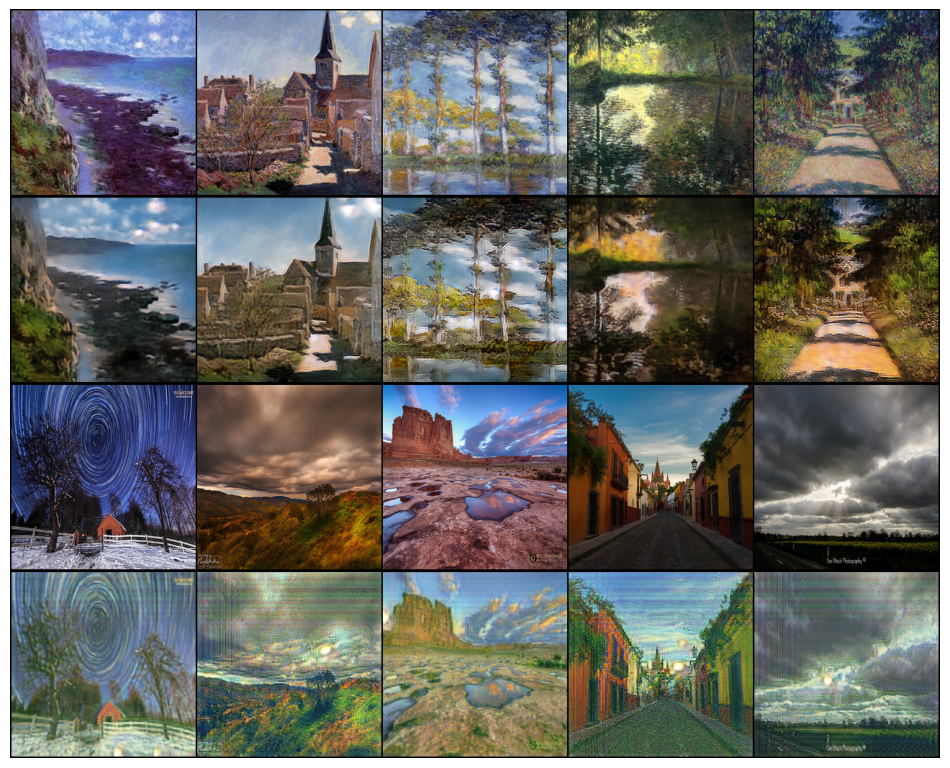

EPOCH: 4.000  loss_GAN: 0.763  loss_D: 0.099  loss_cycle: 0.174  loss_G: 3.306  loss_identity: 0.161  (5515.59s - 1378.90s remaining)
EPOCH: 5.000  loss_D: 0.194  loss_G: 3.647  loss_GAN: 0.751  loss_cycle: 0.195  loss_identity: 0.188  (6890.74s - 0.00s remaining)

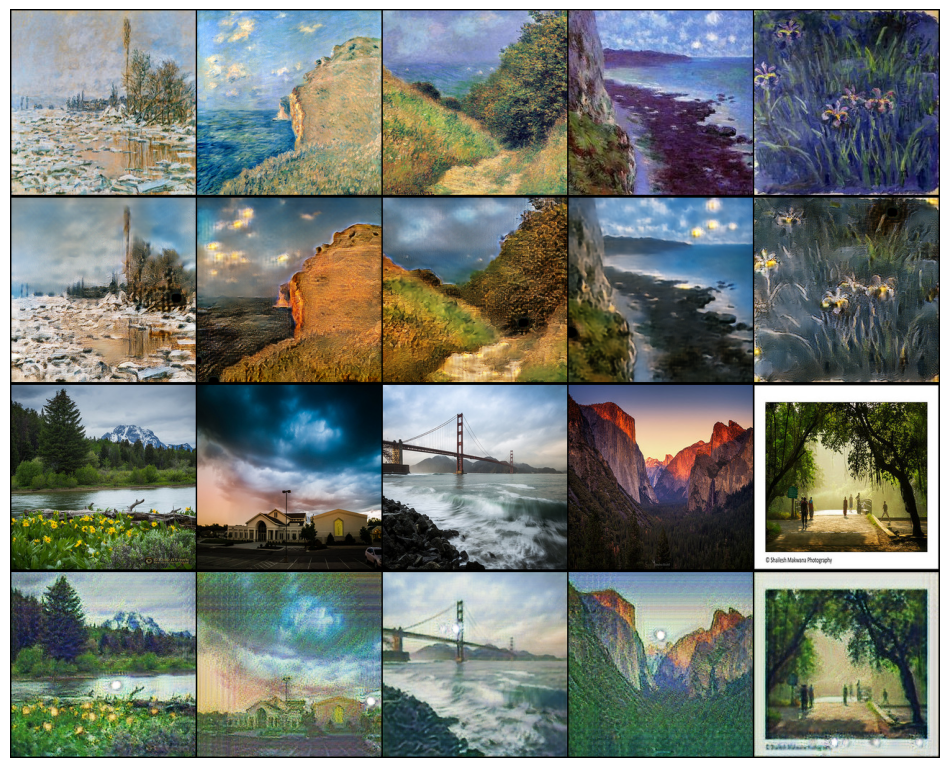

EPOCH: 5.000  loss_GAN: 0.784  loss_D: 0.090  loss_cycle: 0.173  loss_G: 3.314  loss_identity: 0.160  (6891.60s - 0.00s remaining)


In [ ]:
import torch

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

G_AB = G_AB.to(device)
G_BA = G_BA.to(device)
D_A = D_A.to(device)
D_B = D_B.to(device)

n_epochs = 5
log = Report(n_epochs)
for epoch in range(n_epochs):
    N = len(trn_dl)
    for bx, batch in enumerate(trn_dl):
        real_A, real_B = batch
        # Move the batches to the device
        real_A = real_A.to(device)
        real_B = real_B.to(device)

        # Training steps
        loss_G, loss_identity, loss_GAN, loss_cycle, _, fake_A, fake_B = generator_train_step((G_AB, G_BA), optimizer_G, real_A, real_B)
        loss_D_A = discriminator_train_step(D_A, real_A, fake_A.detach(), optimizer_D_A)
        loss_D_B = discriminator_train_step(D_B, real_B, fake_B.detach(), optimizer_D_B)
        loss_D = (loss_D_A + loss_D_B) / 2

        log.record(epoch+(1+bx)/N, loss_D=loss_D.item(), loss_G=loss_G.item(),
                   loss_GAN=loss_GAN.item(), loss_cycle=loss_cycle.item(),
                   loss_identity=loss_identity.item(), end='\r')

    generate_sample()

    log.report_avgs(epoch+1)

100%|██████████| 106/106 [00:02<00:00, 36.90it/s]


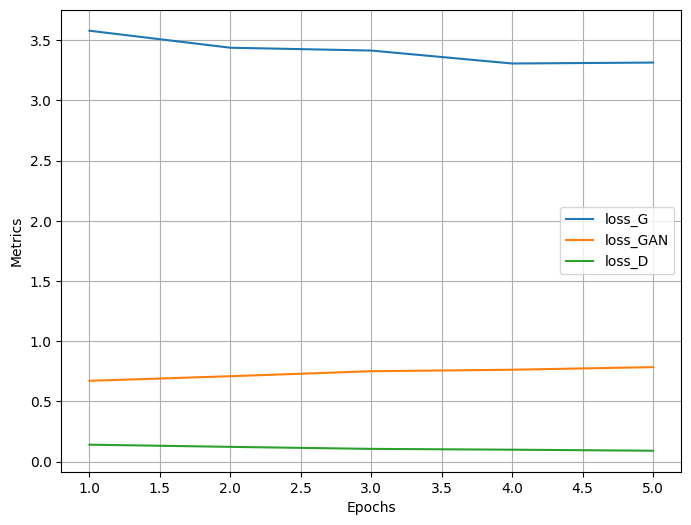

In [37]:
log.plot_epochs(['loss_G','loss_GAN', 'loss_D'])

### Displaying images from the validation set

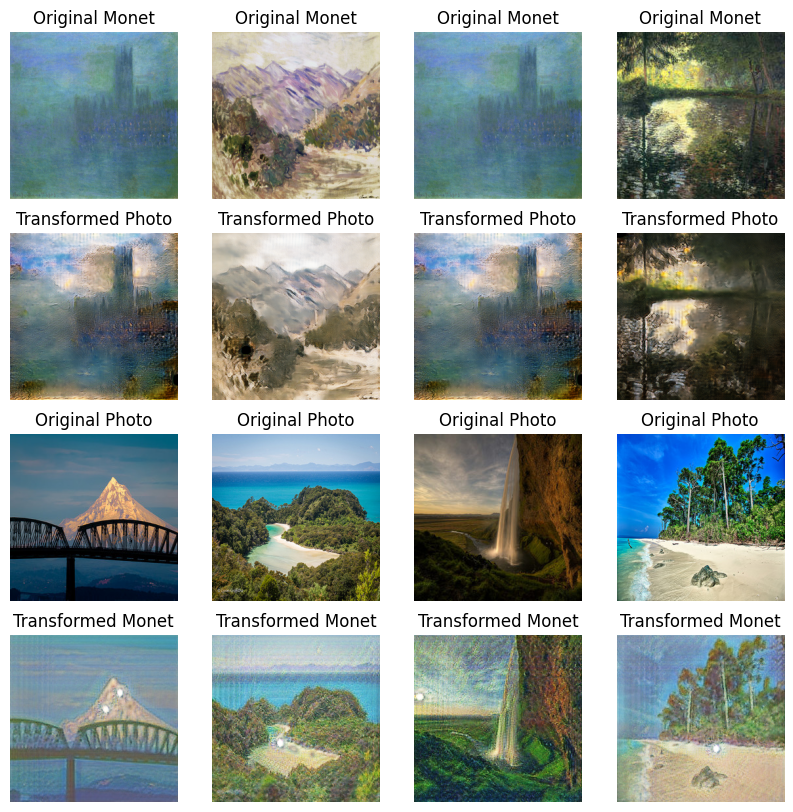

In [40]:
import matplotlib.pyplot as plt
import torchvision.utils as vutils
import numpy as np

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Utility function to denormalize and preparing images for display
def denormalize(image):
    image = image * 0.5 + 0.5
    image = image.clamp(0, 1)
    image = image.permute(1, 2, 0)
    return image.cpu().numpy()

# Setting the models to evaluation mode
G_AB.eval()
G_BA.eval()

# Fetching a batch of images from the validation DataLoader
monet_paintings, photos = next(iter(val_dl))
monet_paintings = monet_paintings.to(device)
photos = photos.to(device)

# Transforming images
with torch.no_grad():
    generated_photos = G_AB(monet_paintings)
    generated_monet = G_BA(photos)

# Displaying the first few images in the batch
plt.figure(figsize=(10, 10))

# Displaying the Monet paintings and their transformation to photos
for i in range(min(monet_paintings.size(0), 4)):  # Displaying the first 4 images
    plt.subplot(4, 4, i+1)
    plt.imshow(denormalize(monet_paintings[i]))
    plt.title("Original Monet")
    plt.axis("off")

    plt.subplot(4, 4, i+5)
    plt.imshow(denormalize(generated_photos[i]))
    plt.title("Transformed Photo")
    plt.axis("off")

# Displaying real photos and their transformation to Monet-style paintings
for i in range(min(photos.size(0), 4)):
    plt.subplot(4, 4, i+9)
    plt.imshow(denormalize(photos[i]))
    plt.title("Original Photo")
    plt.axis("off")

    plt.subplot(4, 4, i+13)
    plt.imshow(denormalize(generated_monet[i]))
    plt.title("Transformed Monet")
    plt.axis("off")

plt.show()

### Applying CycleGAN to a picture of choice



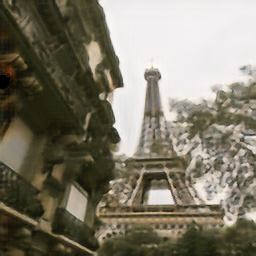

In [41]:
from PIL import Image
import torch
from torchvision import transforms

# Step 1: Loading the image
image_path = '/content/drive/MyDrive/Photo.jpg'
image = Image.open(image_path).convert('RGB')

# Step 2: Transforming the image as per the model's requirements
transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
    transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])
])

image = transform(image).unsqueeze(0)  # Adding batch dimension

image = image.to(device)

# Step 4: Applying the CycleGAN model
with torch.no_grad():
    transformed_image = G_AB(image)

# Step 5: Post-processing the image
transformed_image = transformed_image.squeeze(0)
transformed_image = (transformed_image + 1) / 2
transformed_image = transformed_image.clamp(0, 1)
transformed_image = transforms.ToPILImage()(transformed_image)

# Step 6: Saving and displaying the image
transformed_image_path = '/content/drive/MyDrive/transformed-image.jpg'
transformed_image.save(transformed_image_path)

display(transformed_image)

#### Report

#### Exploring the transformation of Monet's impressionistic art into realistic photographs using CycleGAN on the Monet to Photo dataset revealed promising outcomes, even after just 5 epochs, which took almost two hours to complete. These results showcase CycleGAN's ability to grasp and translate the stylistic nuances between distinct visual domains effectively. This also demonstrated the model's potential in artistic style transfer, while also highlighting its versatility for a range of applications, such as photo enhancement, synthetic data creation, and novel content development. The efficiency and significant progress observed in this initial training phase underscore the potential of CycleGAN for bridging artistic styles, opening up exciting possibilities for both creative endeavors and practical applications.